## PW on graphcut optimization (binary case)
This session is divided into 3 parts:


* a part on Bayesian classification (see PW1 and PW2)
* a part on object/background segmentation of a colour image with a CRF (conditional random filed)
* a part on the iterative segmentation of a textured image

We will use the PyMaxflow library for the calculation of the graphcut.

In [1]:
import math
import os
import platform
import random
import ssl
import tempfile

import matplotlib.pyplot as plt
import maxflow  # if not installed, install Maxflow
import numpy as np
from bokeh.io import output_notebook
from bokeh.plotting import figure, output_file
from bokeh.plotting import show
from bokeh.plotting import show as showbokeh
from scipy import ndimage as ndi
from skimage import io

ssl._create_default_https_context = ssl._create_unverified_context
output_notebook()


def display_segmentation_borders(image, bin):
    imagergb = np.copy(image)
    from skimage.morphology import binary_dilation, disk

    contour = binary_dilation(bin, disk(15)) ^ bin
    imagergb[contour == 1, 0] = 255
    imagergb[contour == 1, 1] = 0
    imagergb[contour == 1, 2] = 0
    return imagergb

Loading BokehJS ...

## Binary classification of a noisy image

You have a binary image *IoriginaleBW.png* (binary image of the two classes) and its observed version with a certain distribution of grey levels for each class *Iobservee.png*. The objective is to perform a two-class classification of this observed image (see PW1 and PW2).

### Analysis of the distributions of the 2 classes of the image}


Q1: What are the distributions of the two classes of the image ($P(Y_s|X_s=0)$ (black class) and $P(Y_s|X_s=0)$ (white class))?

Q2: Give the means and variances of the two classes.

*The distributions and the means and variances found in the previous sessions will be used without justification*.

**Your answer &#x270D;**

A1:

Both classes follow a Gaussian distribution:

- Class 0:

  <img src="./images/class0Dist.png" alt="class0Dist.png" width="400"/>

- Class 1:

  <img src="./images/class1Dist.png" alt="class1Dist.png" width="400"/>

A2:

- Class 0, corresponding to the dark regions, has a mean of a $97.40$ and a variance of $502.57$ $\therefore P(Y_s|X_s = 0) = \mathcal{N}(97,503)$;
- Class 1, corresponding to the light regions, has a mean of a $163.88$ and a variance of $512.73$ $\therefore P(Y_s|X_s = 1) = \mathcal{N}(164,513)$;

We assume, however, that both classes have the same variance.

## 1.1: Graphcut optimization

Q3: How many nodes does the graph have that is constructed for the search for the minimum capacity cut with only two neighbouring pixels? What do they correspond to? What do the data attachment terms in this graph correspond to and what values do they have for two observed pixels of values $y_s$ and $y_t$? What does the regularisation term correspond to?

**Your answer &#x270D;**

A3:

The graph has $4=p + 2$ nodes, with $p=2$ the number of pixels, constructed for the search of the minimum capacity cut with only two neighboring pixels:
- 1 for every pixel;
- 1 for sink and 1 for source.

The data attachment terms $\mathcal{D}(x_s, y_s)$ correspond to the weight of the edges between the nodes of source or the sink, and a node of the pixel from the image. Using that $P(y_s|x_s)\propto \exp(-(y_s-\mu_{x_s})^2)$, we can infer that their values are:
- $\mathcal{D}(0,\ y_p)=(y_p - 97)^2$
- $\mathcal{D}(1,\ y_p)=(y_p - 164)^2$
- $\mathcal{D}(0,\ y_s)=(y_s - 97)^2$
- $\mathcal{D}(1,\ y_s)=(y_s - 164)^2$


The regularization term $\beta$ corresponds to the weight of the edge between two neighboring pixels $y_s$ and $y_p$.

Q4: Complete the python code cell where it says "#TO BE COMPLETED EX1" with the data attachment and regularization terms as indicated. Run the minimum cut algorithm and view the result.

## 1.2 Searching for the optimal $\beta$.



Q5: By completing the program frame provided below, find the optimal $\beta$ value $\beta_{opt}$ using the "true image" $x$ corresponding to IoriginaleBW.png. You can plot the error values between $x$ and the estimated $\hat{x}$ to find $\beta_{opt}$.



**Your answer &#x270D;**

A5:

Below, we can see the scatter plot of the error values. Graphically, $\beta_{\text{opt}}\approx 1886$, which is a proper equilibrium between the magnitude of the data attachment terms and the regularization term.

Q6: What are the advantages of this optimization approach compared to ICM? Compared to simulated annealing? In theory, do we obtain the same result with both methods (simulated annealing and graphcut)? Under what conditions? What is the advantage of simulated annealing in the general case?

**Your answer &#x270D;**

A6:

ICM is a method of quick convergence, in which the algorithm converges to a local minimum, which is dependent on the initial configuration. On the other hand, simulated annealing, which also can be initialized in many ways, slowly converges towards the global minimum, as the temperature parameter must be decreased with a step exponentially smaller and reach a magnitude close to $0$.

In a general case, both the graph-cut optimization and the simulated annealing methods obtain very similar results as they converge towards the global minimum. This is not the case, however, for the ICM method since it converges towards a local minimum, as the method strongly depends on the initial configuration.

It is important to remark that the graph-cut optimization method requires the inference of a probabilistic distribution associated to the pixels belonging to each class of the image to determine the weight of the edges of the graph. Such inference is not necessary neither on simulated annealing and on ICM, although it might be useful to instantiate a 'good' initialization for the methods. A bad determination of the weight of the edges of the graph, which can be caused by an also bad inference on the probabilistic distributions, would negatively affect the results of the graph-cut optimization method.


Q7: How can you explain that the error rate with the true image can be lower with the simulated annealing result or the ICM than with the graph-cut optimisation?
  

**Your answer &#x270D;**

A7:

As explained on question Q6, the error rate can be lower with the simulated annealing or the ICM than with the graph-cut optimization if the strategy employed to build the graph is not feasible, which can be caused by a bad inference on the probabilistic distribution of the pixels belonging to each class of the image.

Q8: What are the advantages and disadvantages of the Ising model?

**Your answer &#x270D;**

A8:

Ising model is a simple model with an straight-forward implementation and also low computational complexity. The disadvantages of this model are its preference of homogeneous regions, which is evident when $\beta$ is too big; the poor accountability for gradual and continuous transitions; and its sensitivity to noise.

In [2]:
# Loading images
im_obs = io.imread(
    "https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png"
)  # Observed image, noisy
im_orig = io.imread(
    "https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png"
)  # Binary reference image, to assess the quality of the segmentation

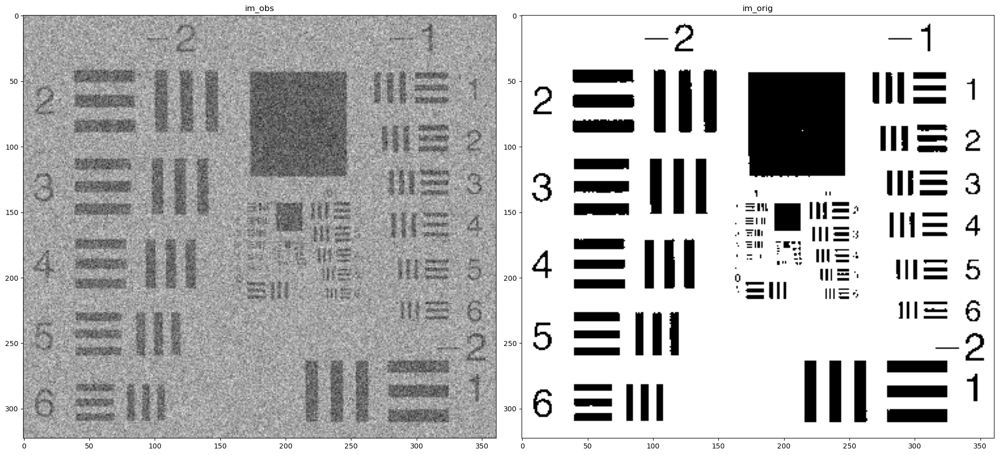

In [3]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
axs[0].imshow(im_obs, cmap="gray")
axs[0].set_title("im_obs")
axs[1].imshow(im_orig, cmap="gray")
axs[1].set_title("im_orig")

plt.tight_layout()
plt.show()

In [4]:
# TO BE COMPLETED EX1
beta = 1886  # beta value
# m0 and m1 values from the previous practical work
m0 = 97.40
m1 = 163.88

## binary graph-cut

# Create the graph.
g = maxflow.Graph[float]()  # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_obs.shape)

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
g.add_grid_tedges(nodeids, (im_obs - m0) ** 2, (im_obs - m1) ** 2)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

Max Flow: 77191248.1823983


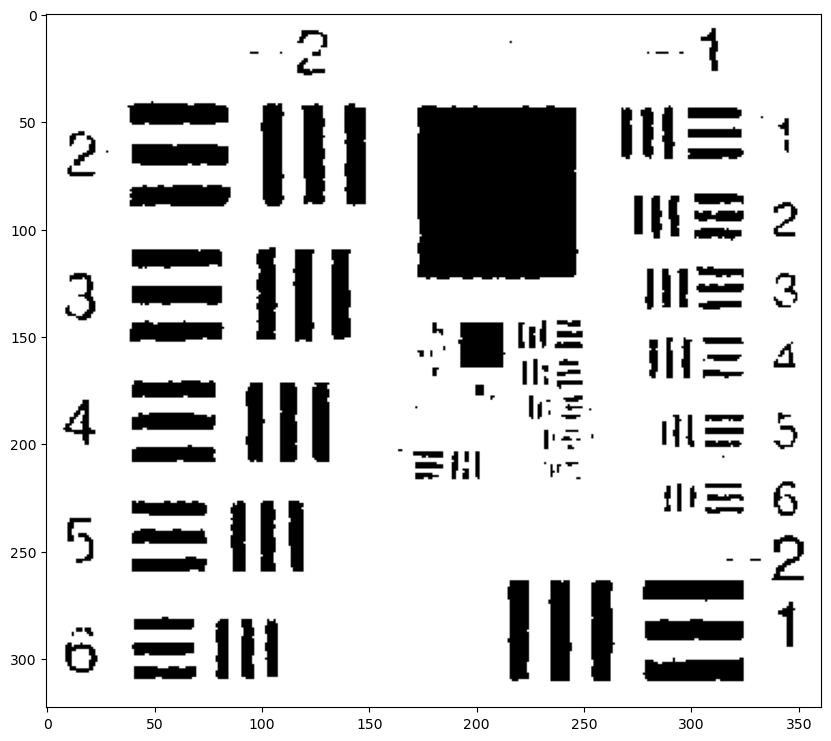

In [5]:
plt.figure(figsize=(10, 10))
plt.imshow(im_bin, cmap="gray")
plt.show()

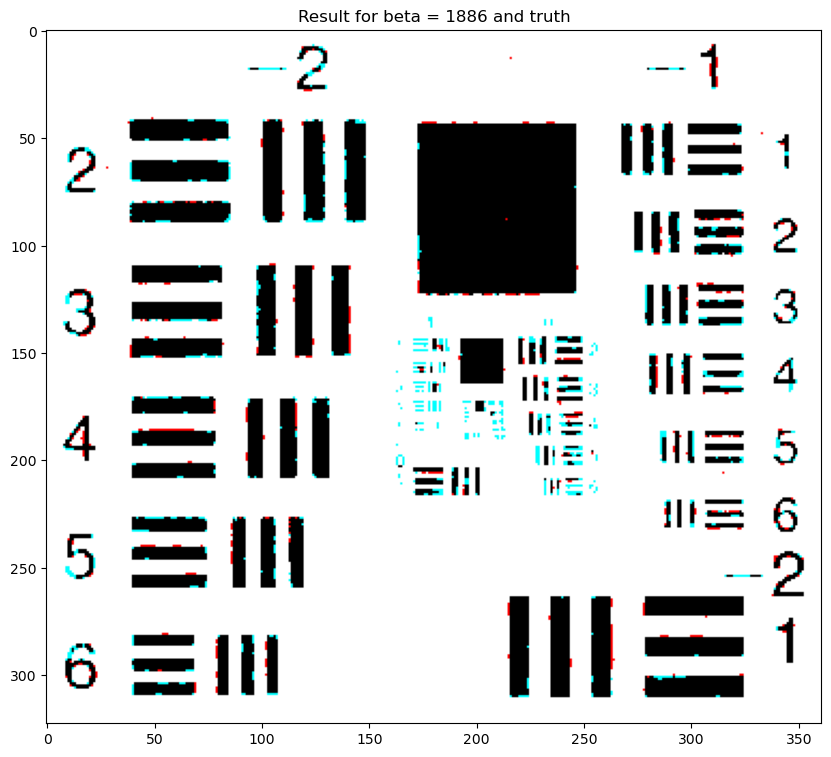

Number of misclassified pixels for beta =  1886 :  2180


In [6]:
# compute the error image between im_bin and im_orig (the ideal solution) using
# np.abs and np.sum
error = np.sum(np.abs(im_orig - im_bin))
plt.rcParams["figure.figsize"] = [10, 10]
# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin, im_bin)) * 255)
plt.title("Result for beta = " + str(beta) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ", beta, ": ", int(error))

### Search for the best parameter $\beta$

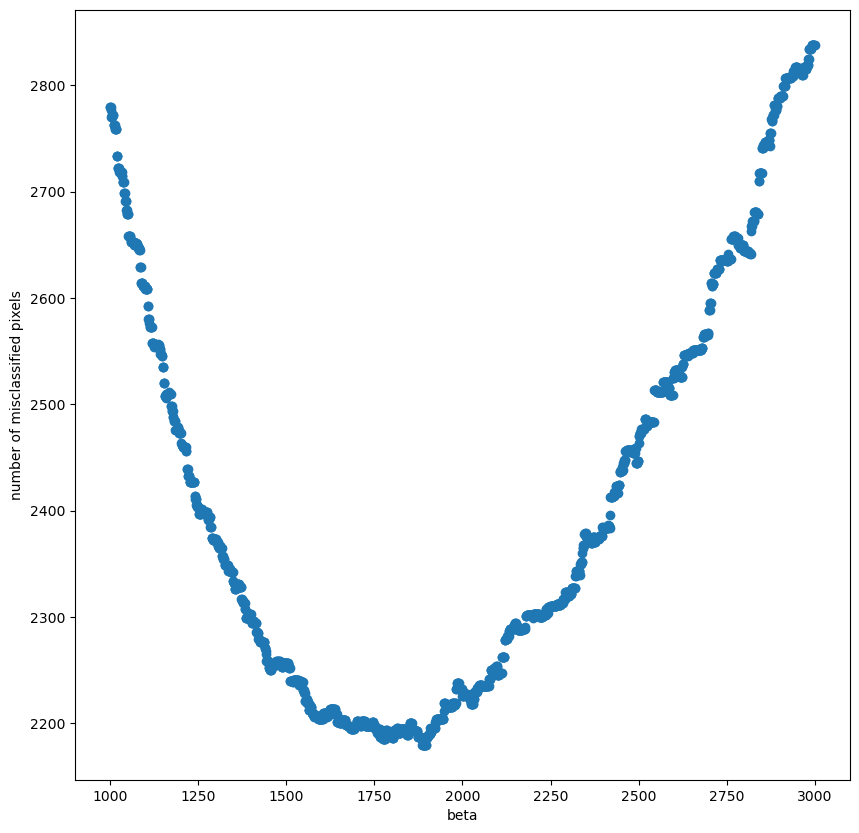

Best beta value:  1886


In [7]:
im_obs = io.imread(
    "https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png"
)  # Observed image, noisy
im_orig = io.imread(
    "https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png"
)  # Binary reference image, to assess the quality of the segmentation

list_beta = []
list_errors = []

# TO BE COMPLETED - choose a range of values and a step to study beta
for beta in range(1000, 3000):
    # TO BE COMPLETED
    m0 = 97.40
    m1 = 163.88

    ## Binary graph cut

    # Create the graph
    g = maxflow.Graph[float]()  # graph instantiation

    # Add the nodes. nodeids has the identifiers of the nodes in the grid.
    nodeids = g.add_grid_nodes(im_obs.shape)
    # Add non-terminal edges with the same capacity.
    g.add_grid_edges(nodeids, beta)
    # Add the terminal edges.
    # TO BE COMPLETED
    g.add_grid_tedges(nodeids, (im_obs - m0) ** 2, (im_obs - m1) ** 2)

    # Find the maximum flow.
    flow = g.maxflow()

    # Get the segments of the nodes in the grid.
    sgm = g.get_grid_segments(nodeids)
    # create the output image
    im_bin = np.int_(np.logical_not(sgm))

    # print("beta = ",beta)
    # compute the error
    # TO BE COMPLETED
    error = np.sum(np.abs(im_orig - im_bin))
    list_beta.append(beta)
    list_errors.append(error)

plt.figure()
plt.scatter(list_beta, list_errors)
plt.xlabel("beta")
plt.ylabel("number of misclassified pixels")
plt.show()

best_beta = list_beta[np.argmin(np.array(list_errors))]

print("Best beta value: ", best_beta)

## 2. Classification of a colour image

The objective of this part is to carry out an extension of the method seen previously in the case of the treatment of a colour image *avions.png* in which one wants to separate the objects from the background.

We will first use the same framework (Ising model) as before but with a three-dimensional data attachment (assuming convariance matrices equal to the identity). Then we will introduce a CRF (conditional random field) by weighting the regularisation term of the Ising model by the modulus of the gradient between two pixels of the observed image.  

### 2.1 Binary classification
From the program structure below, carry out the different steps necessary for this classification:
1. Modelling of the background and object distributions (in 3 dimensions this time)
1. Definition of the data attachment term
1. Choice of a value for the regularisation parameter for the Ising model
1. Finding the minimal cut to obtain the object/background classification.

Q9: Comment on these steps and the results obtained.

**Your answer &#x270D;**

A9:

For these steps: it is necessary to determine the mean of each class, which is a 3 dimensional value; we assume no correlation between the three color components, so that the data attachment term can be calculated by the euclidean distance, that is, the sum, color channel wise, of the squared difference between the image and a given class mean; the regularization term is chosen to yield acceptable results as not to wrongly classify the pixels of the image, with small errors on the interfaces of the classes.

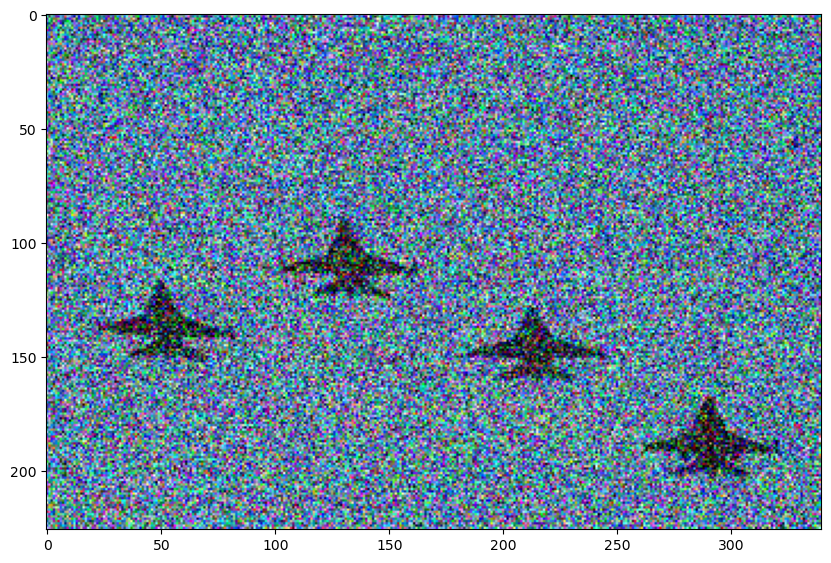

In [8]:
# Loading and displaying the image
im_planes = io.imread(
    "https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/planes.png"
)

plt.figure()
plt.rcParams["figure.figsize"] = [15, 15]
plt.imshow(im_planes)
plt.show()

#### Determining the parameters of the classes


Plane class: we can use the values of the rectangle `[180:200, 280:300]`.

Example: `np.mean(image[180:200, 280:300, 1])` returns the average of the selected area for channel 1

In [9]:
# mean of the plane class - 3D vector
# TO BE COMPLETED
m_planes = np.mean(im_planes[180:200, 280:300], axis=(0, 1))

# mean of the sky class
# you can use values in the following square [0:100,150:300]
# TO BE COMPLETED
m_sky = np.mean(im_planes[0:100, 150:300], axis=(0, 1))

print("For the sky, [R,G,B] = ", m_sky)
print("For the planes, [R,G,B] = ", m_planes)

# check that the obtained values are coherent

For the sky, [R,G,B] =  [ 93.96126667 127.14426667 156.2286    ]
For the planes, [R,G,B] =  [53.645  56.4725 70.2075]


In [10]:
# affiche(im_bin, titre="Result for beta = " + str(beta));
# choose a beta value
# TO BE COMPLETED
beta = 15000

# TO BE COMPLETED
## Binary graph-cut
# use the previous program to create the graph and compute the cut
# be careful of computing the terminal weights using the 3D values
# you can compute 2 distance images with in each pixel the
# quadratic distance to the mean value of each class

# Create the graph.
g = maxflow.Graph[float]()  # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_planes.shape[:-1])

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
g.add_grid_tedges(
    nodeids,
    np.sum((im_planes - m_sky.reshape((1, 1, 3))) ** 2, axis=2),
    np.sum((im_planes - m_planes.reshape((1, 1, 3))) ** 2, axis=2),
)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

Max Flow: 1092089230.256753


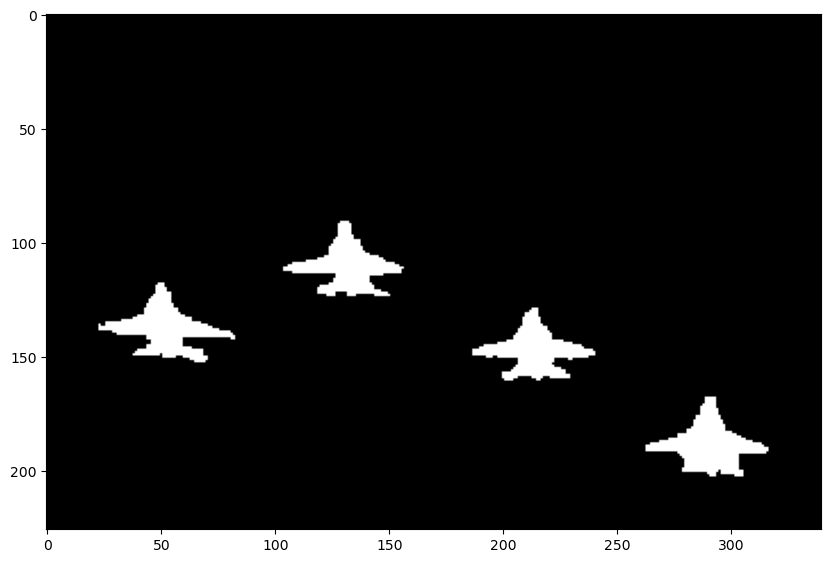

In [11]:
plt.rcParams["figure.figsize"] = [10, 10]
plt.imshow(im_bin, cmap="gray")
plt.show()

### 2.2 Use of a CRF (Conditional Random Field) model

We will try here to adapt the model used previously to favour transitions where they are compatible with the gradient. To do this, we will replace the constant $\beta$ for the whole image by a "beta_field" which depends on the norm of the gradient.

Q10: Calculate and display the modulus of the gradient of the aircraft image after it has been grayscaled and convolved by a Gaussian kernel of standard deviation 1. Why use the `boundary="symm"` option when convolving through the Sobel filter? Try it without doing the Gaussian filtering. What is the point?

**Your answer &#x270D;**

A10:

From the documentation, `boundary="symm"` implies "symmetrical boundary conditions". In practice, this eliminates the extra padding added to convolve the filter and the image, which corresponds to the "transition region" while the filter is not completely inside the image. This is useful to avoid fake borders generated from such "transition region".

The Gaussian filtering is useful to attenuate the high frequency components of the image, which smooths the gradient as the local variation of the gray levels is attenuated. This process yields the overall process more robust to noise.

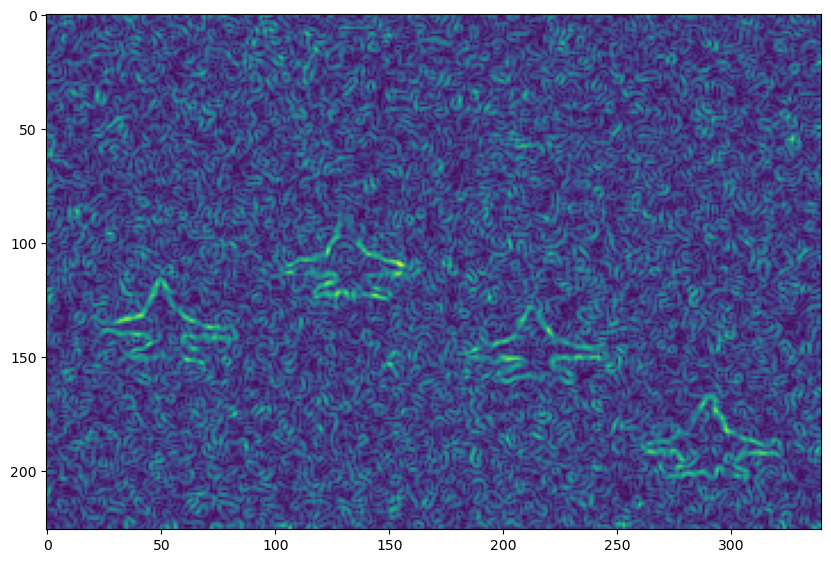

In [12]:
import scipy.signal
import scipy.ndimage
from skimage import color


def gradient(image):
    """Array -> tuple[Array*Array]"""
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=float)
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=float)
    # to be completed
    # use mode = 'same' and boundary='symm' in scipy.signal.convolve2d
    # TO BE COMPLETED
    derivative_x = scipy.signal.convolve2d(image, sobel_x, mode="same", boundary="symm")
    derivative_y = scipy.signal.convolve2d(image, sobel_y, mode="same", boundary="symm")
    return [derivative_x, derivative_y]


plane_nb = scipy.ndimage.gaussian_filter(color.rgb2gray(im_planes), 1)
plane_x, plane_y = gradient(plane_nb)
# calculation of the gradient modulus
# TO BE COMPLETED
grad_av = np.sqrt(plane_x**2 + plane_y**2)
plt.figure()
plt.imshow(grad_av)
plt.show()


Complete the code for segmentation by CRF. We will choose $beta\_field=\beta_2\cdot\exp(-grad\_av/h)$ We can use $h=300$ and $\beta_2=20000$. Also replace the constant beta by the field "beta_field" during the "g.add_grid_edges" step.

Q11: Compare the results with and without the contour term.

**Your answer &#x270D;**

A11:

By using the gradient it is possible to obtain a better detection on the contours. As the image is simple, however, the difference is not specially outstanding.

Max Flow: 1096010178.2865467


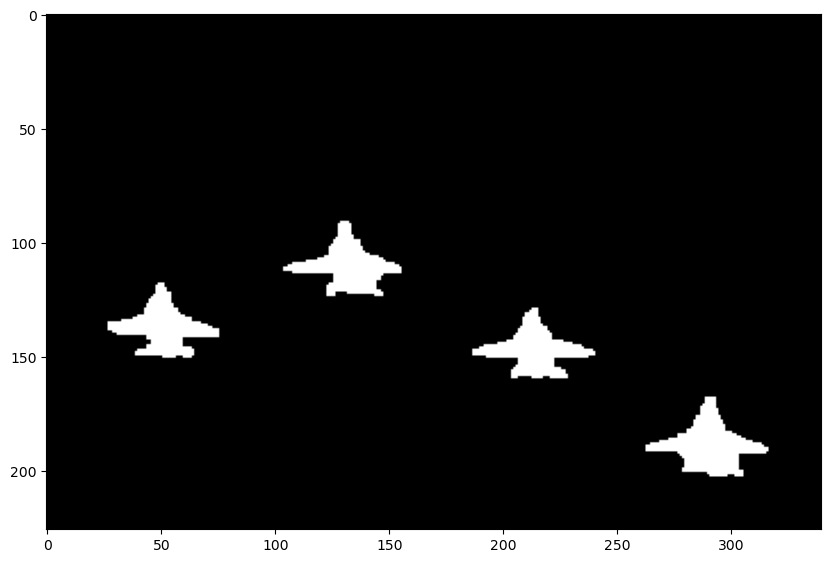

In [13]:
# calcul de beta_field
# ce champ définira la valeur pour les 4-voisins
# TO BE COMPLETED
h = 300
beta2 = 20000
beta_field = beta2 * np.exp(-grad_av / h)

## Graph cut binaire
# compléter en reprenant votre code précédent et en remplaçant
# beta par beta_field dans la ligne g.add_grid_edges
g = maxflow.Graph[float]()  # Instanciation du graph

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_planes.shape[:-1])

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta_field)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
g.add_grid_tedges(
    nodeids,
    np.sum((im_planes - m_sky.reshape((1, 1, 3))) ** 2, axis=2),
    np.sum((im_planes - m_planes.reshape((1, 1, 3))) ** 2, axis=2),
)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

# Get the segments of the nodes in the grid.
# Renvoie 1 si le pixel est du coté du drain après calcul de la coupe
# min, 0 si il est du coté de la source
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

plt.imshow(im_bin, cmap="gray")
plt.show()

## 3. Iterative Segmentation with Gaussian Mixture

Q12: Display the "zebra" image below. Is it possible to segment the zebra with the method used to segment the planes?



**Your answer &#x270D;**

A12:

It is not possible to segment the zebra with the method used to segment the planes, as the image, specially the texture of the zebra, is more complex.

For example, it would not be possible to simply use the mean of the a given area pertaining to the zebra class to distinguish it from the background, as the zebra is generally composed of a rather complex texture formed by black and white.

uint8


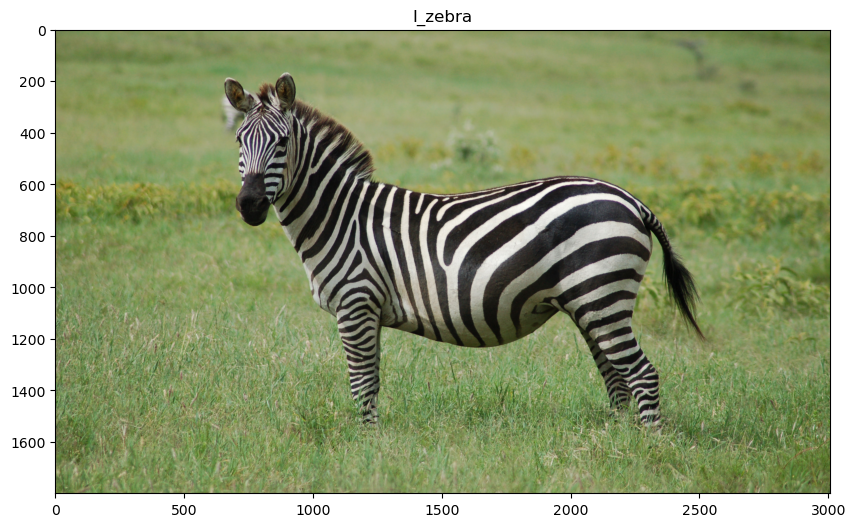

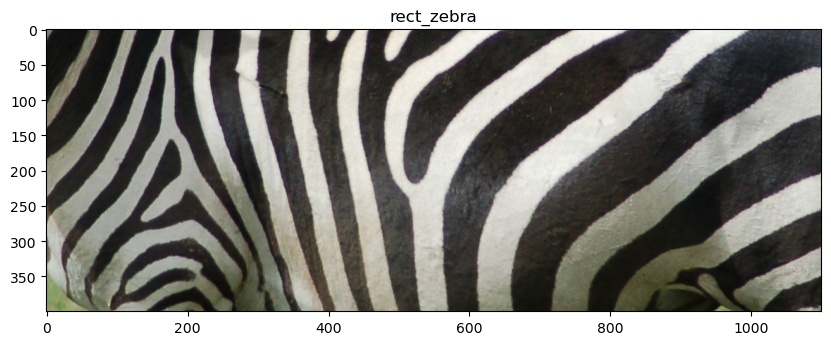

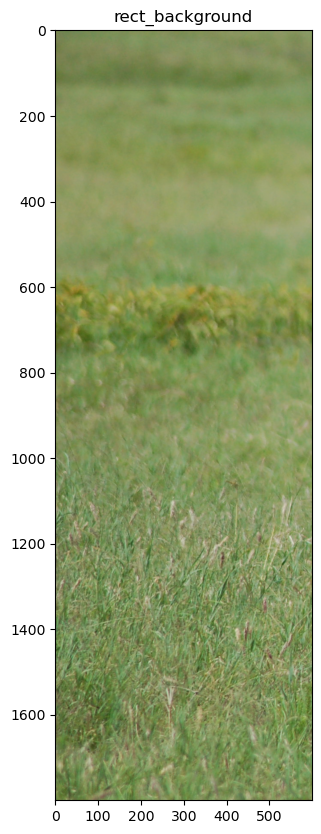

In [14]:
### Loading a new image
I_zebra = io.imread(
    "https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Equus_quagga.jpg"
)
I_zebra = I_zebra[200:, :, :]
rect_zebra = I_zebra[700:1100, 1000:2100]
rect_background = I_zebra[:, 0:600]
print(I_zebra.dtype)

plt.figure()
plt.imshow(I_zebra)
plt.title("I_zebra")
plt.show()

plt.figure()
plt.imshow(rect_zebra)
plt.title("rect_zebra")
plt.show()

plt.figure()
plt.imshow(rect_background)
plt.title("rect_background")
plt.show()

Q13: Calculate the covariance matrix for the `rect_zebra` and the `rect_background`. Display the values and comment on the result. What do the diagonal values correspond to?

**Your answer &#x270D;**

A13:

The diagonal values correspond to each color channel's variance. We can observe that each color channel's variances in `rect_zebra` is similar, which is coherent with the mostly black and white texture from the zebra. On the mostly green background, the green channel variance in `rect_background` has a smaller variance.

In [15]:
print(I_zebra.shape)
V_tulip = np.vstack([I_zebra[:, :, i].flatten() for i in range(3)])

M_cov = np.cov(np.vstack([I_zebra[:, :, i].flatten() for i in range(3)]))
print("Full zebra image")
print(M_cov)

M_cov = np.cov(np.vstack([rect_zebra[:, :, i].flatten() for i in range(3)]))
print("Rectangle zebra")
print(M_cov)

M_cov = np.cov(np.vstack([rect_background[:, :, i].flatten() for i in range(3)]))
print("Rectangle background")
print(M_cov)

(1800, 3008, 3)
Full zebra image
[[1506.72829498 1532.31063252 1229.07656578]
 [1532.31063252 1691.94506099 1220.3208793 ]
 [1229.07656578 1220.3208793  1210.38796242]]
Rectangle zebra
[[5504.24135104 5535.45173735 5287.6066819 ]
 [5535.45173735 5589.55992729 5327.41135684]
 [5287.6066819  5327.41135684 5140.71619284]]
Rectangle background
[[314.66520718 225.26933203 255.5870428 ]
 [225.26933203 219.9126776  221.64616138]
 [255.5870428  221.64616138 309.65375015]]


Q14: Display the histogram for the R, G and B channels for the `rect_zebra` image. Comment on the result.

**Your answer &#x270D;**

A14:

We can infer that, on all channels of color, the histograms for the `rect_zebra` image are composed by two different classes: one mostly white and the other mostly black. This is due to the "black and white" texture from the zebra.

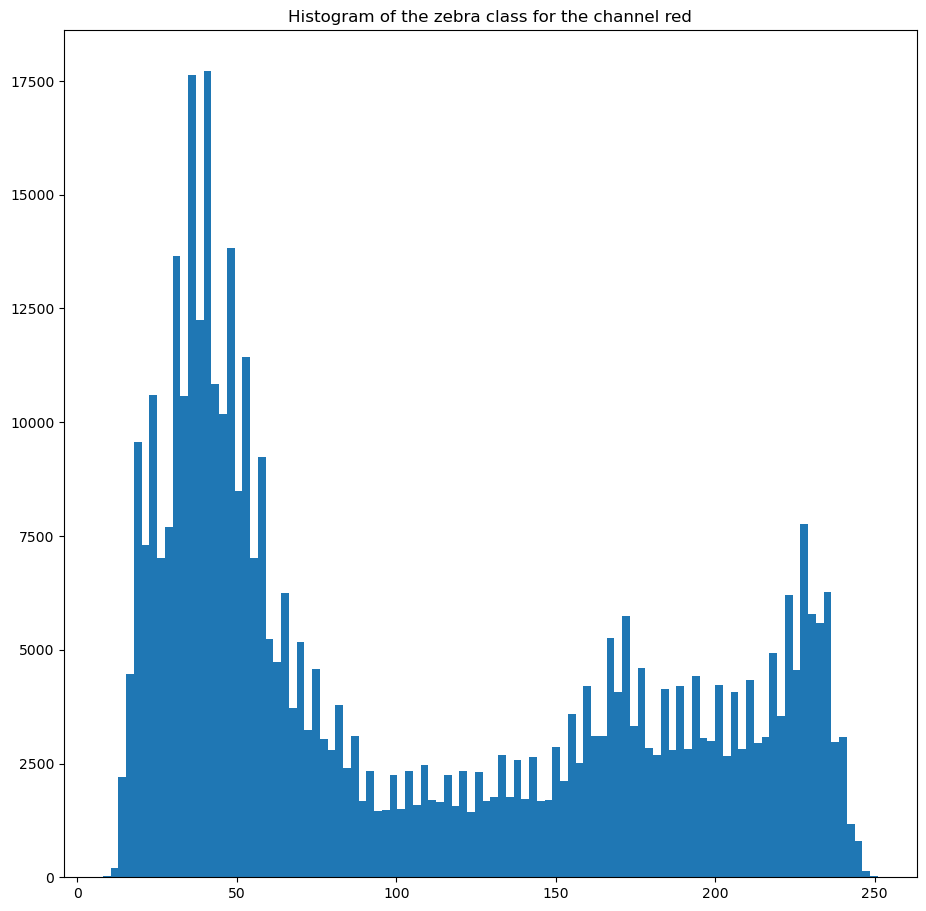

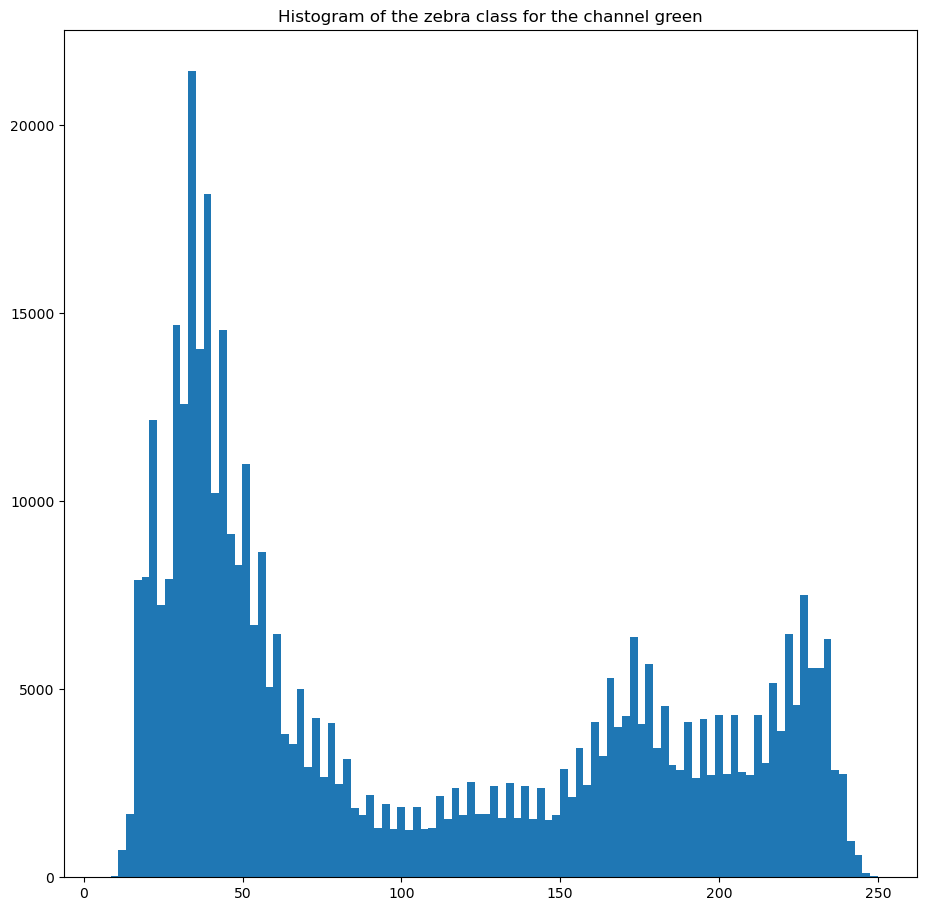

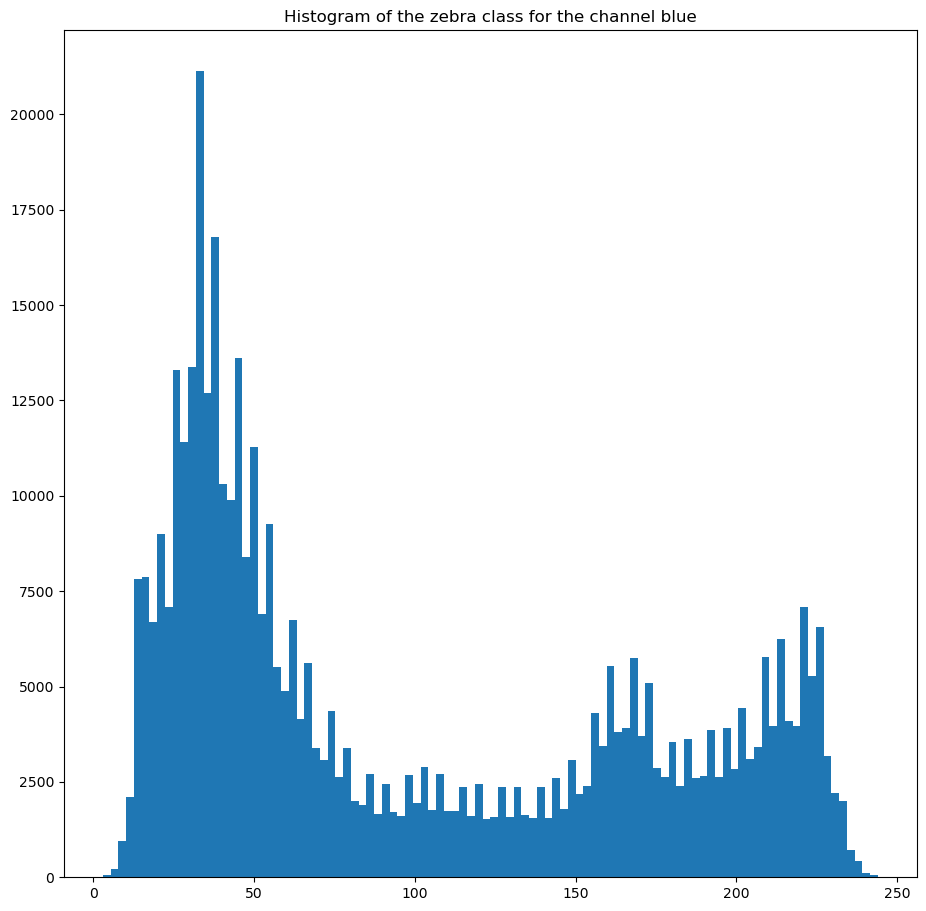

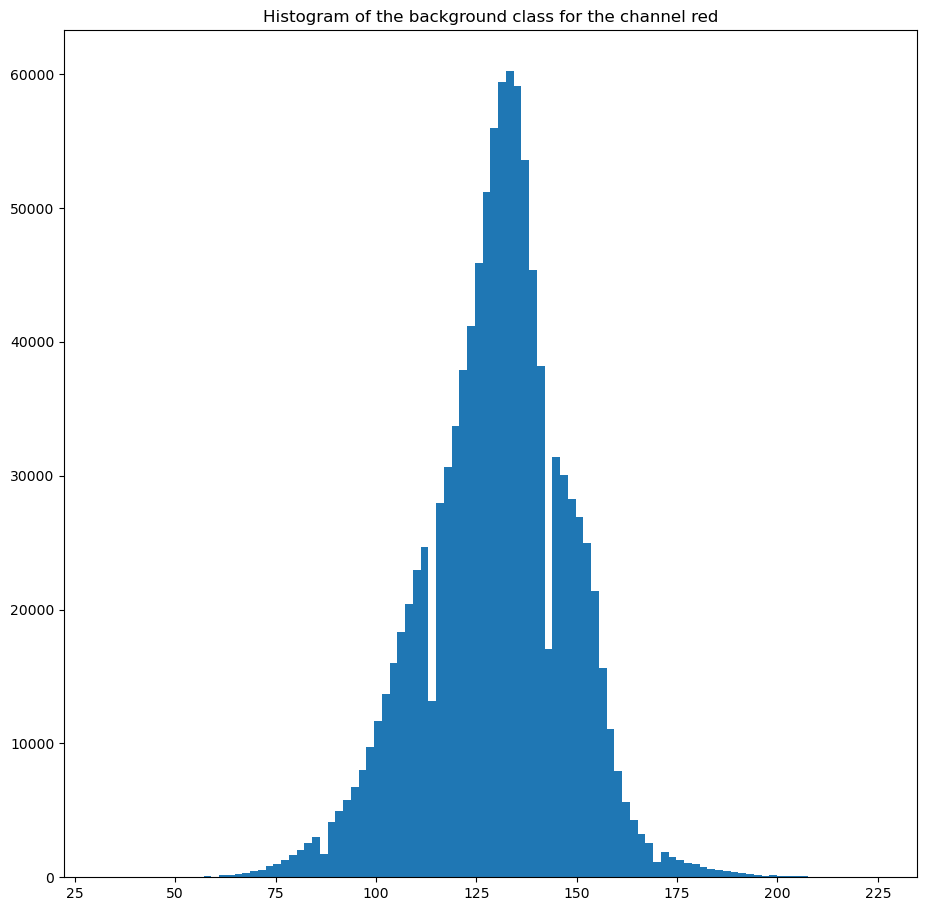

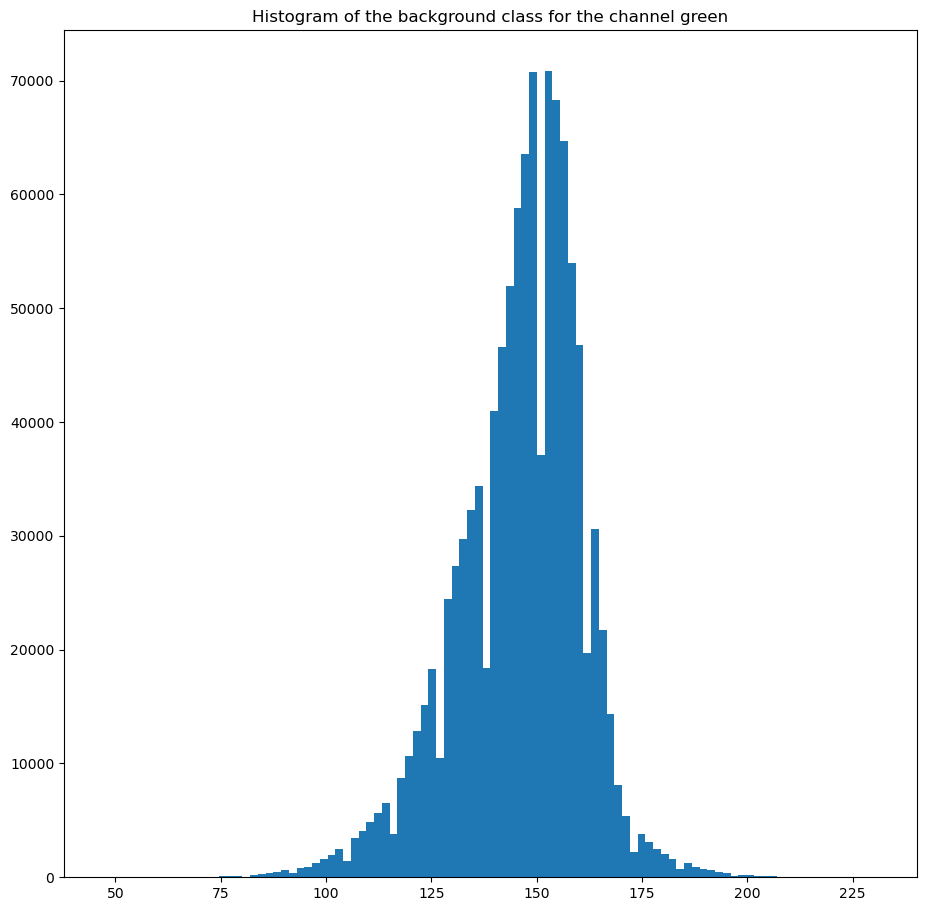

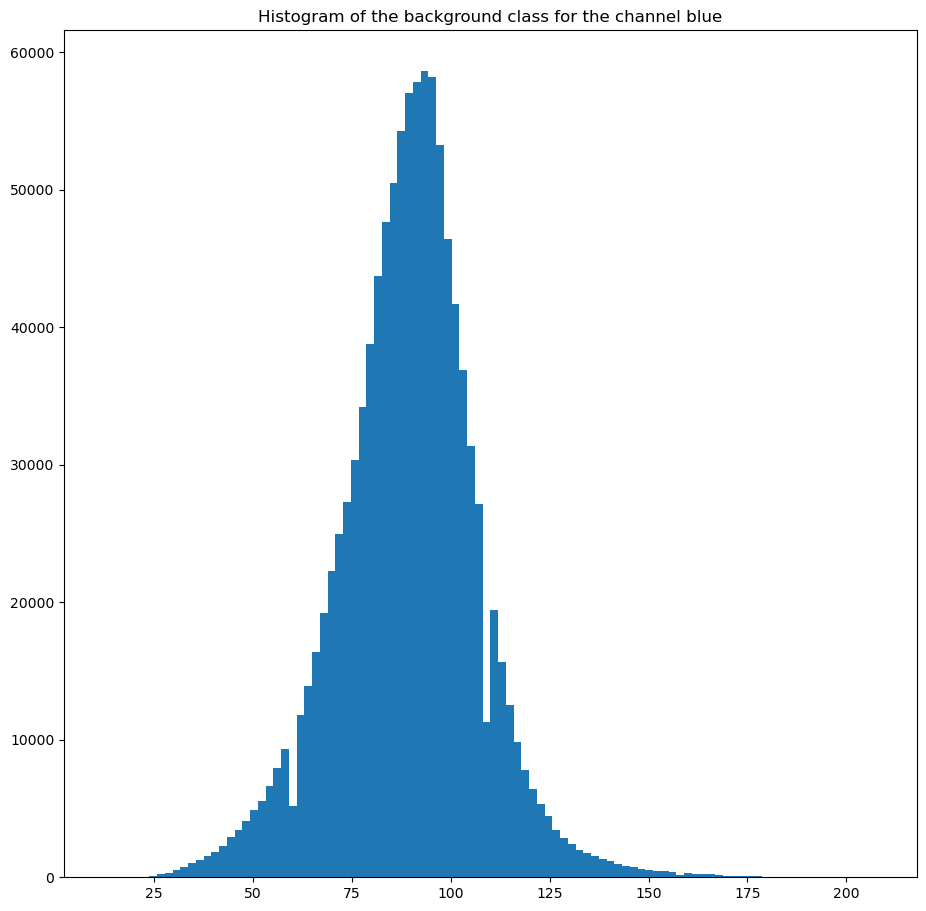

In [16]:
# allows you to change the display size of plt.show
plt.rcParams["figure.figsize"] = [11, 11]

nomchan = ["red", "green", "blue"]
for chan in range(3):
    plt.figure()
    plt.hist(rect_zebra[:, :, chan].flatten(), 100)
    plt.title("Histogram of the zebra class for the channel " + nomchan[chan])
    plt.show()


for chan in range(3):
    plt.figure()
    plt.hist(rect_background[:, :, chan].flatten(), 100)
    plt.title("Histogram of the background class for the channel " + nomchan[chan])
    plt.show()

Q15: Propose an algorithmic method to identify the two classes of the image `rect_zebra`. Use a `sklearn` implementation of this algorithm to identify the mean vectors ($m_R$, $m_G$, $m_B$) for two classes of the `rect_zebra` image and two classes of the `rect_background` image.

*The following line of code can be used to transform the image into a suitable form.*

`X = np.vstack([rect_zebra[:, :, i].flatten() for i in range(3)]).transpose()`

Comment on the average vectors obtained. They can be displayed as an image using the code provided.

**Your answer &#x270D;**

A15:

The *k-means* algorithm yields the means of the classes which maximise the difference between the clusters. The algorithm successfully identifies the expected classes on the zebra (white and black) and the background (two shades of green).

In [17]:
# computation of class parameters in a semi-automatic way
from sklearn.cluster import KMeans

# use a number of classes=2 for the zebra part (complete n_clusters=?)
X = np.vstack([rect_zebra[:, :, i].flatten() for i in range(3)]).transpose()
kmeans_zebra = KMeans(n_init=10, n_clusters=2, random_state=0).fit(X)
mean_vectors_zebra = kmeans_zebra.cluster_centers_

# use a number of classes=2 for the background part
X = np.vstack([rect_background[:, :, i].flatten() for i in range(3)]).transpose()
kmeans_background = KMeans(n_init=10, n_clusters=2, random_state=0).fit(X)
mean_vectors_background = kmeans_background.cluster_centers_

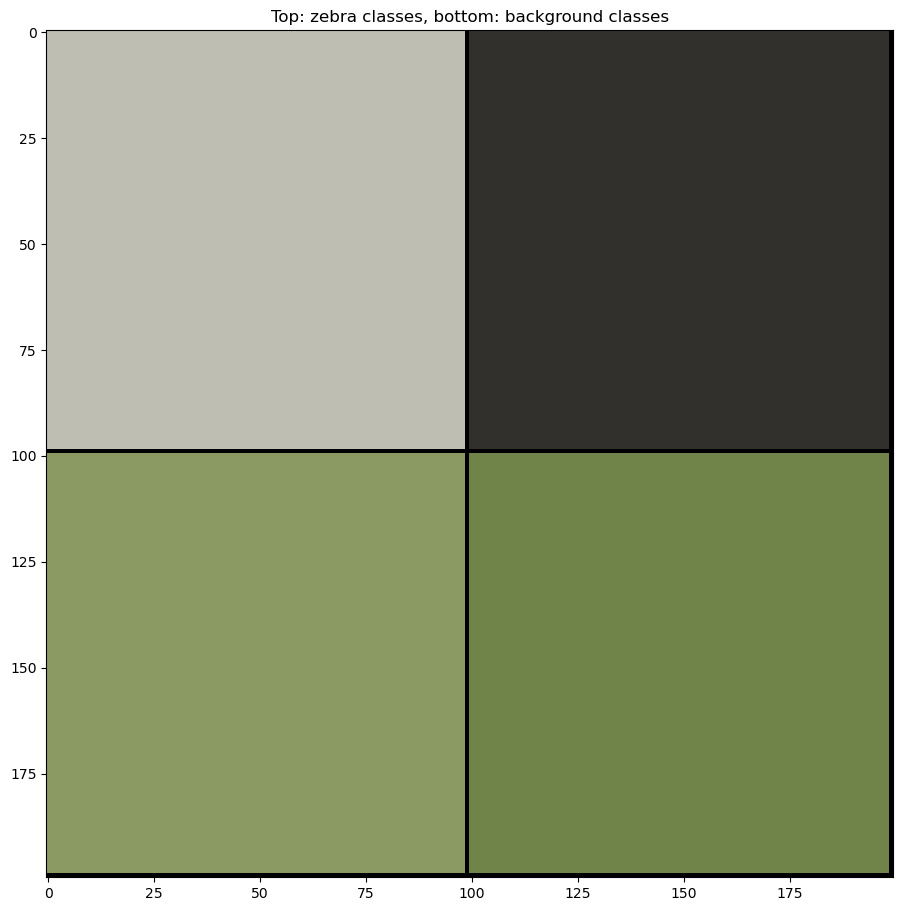

In [18]:
# display of the class centers found as an image
image_mean_vectors = np.zeros((200, 200, 3), np.uint8)
for i in range(3):
    image_mean_vectors[0:99, 0:99, i] = mean_vectors_zebra[0, i]
    image_mean_vectors[0:99, 100:199, i] = mean_vectors_zebra[1, i]
    image_mean_vectors[100:199, 0:99, i] = mean_vectors_background[0, i]
    image_mean_vectors[100:199, 100:199, i] = mean_vectors_background[1, i]

plt.figure()
plt.imshow(image_mean_vectors, vmax=255)
plt.title("Top: zebra classes, bottom: background classes")
plt.show()

Q16: Display separately two neg-log-likelihood images (the neg-log-likelihood was used as a data attachment in the previous example) for the two zebra classes.
Build a neg-log-likelihood image corresponding to the minimum of the two neg-log-likelihoods of the zebra classes. Similarly for the background class.

Display them and comment.

**Your answer &#x270D;**

A16:

On the combined results it is possible to identify a clear and sharp difference between the zebra and the background. On certain parts of the border of the zebra (due to the zebra's stripes) the differences are not as sharp. From these, it is expected some classification errors on the borders.

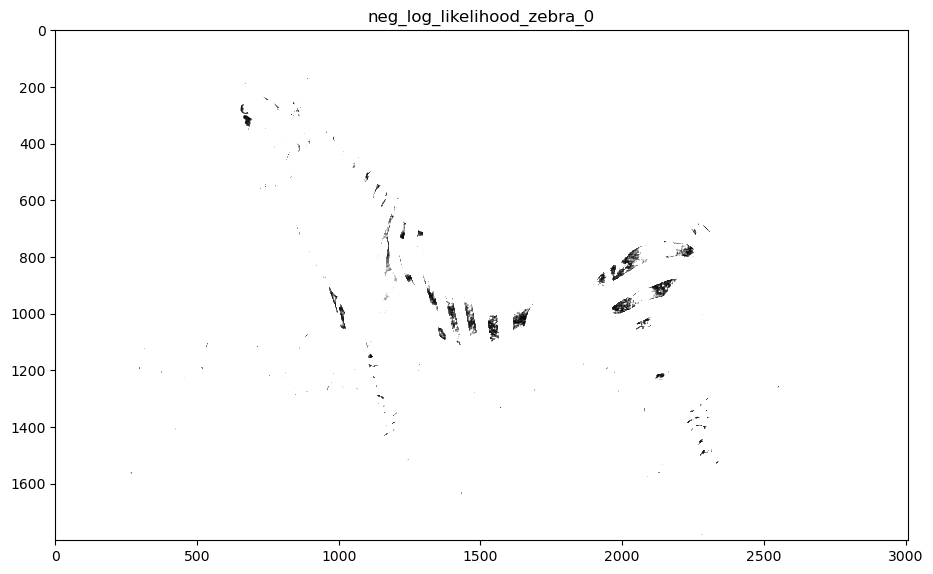

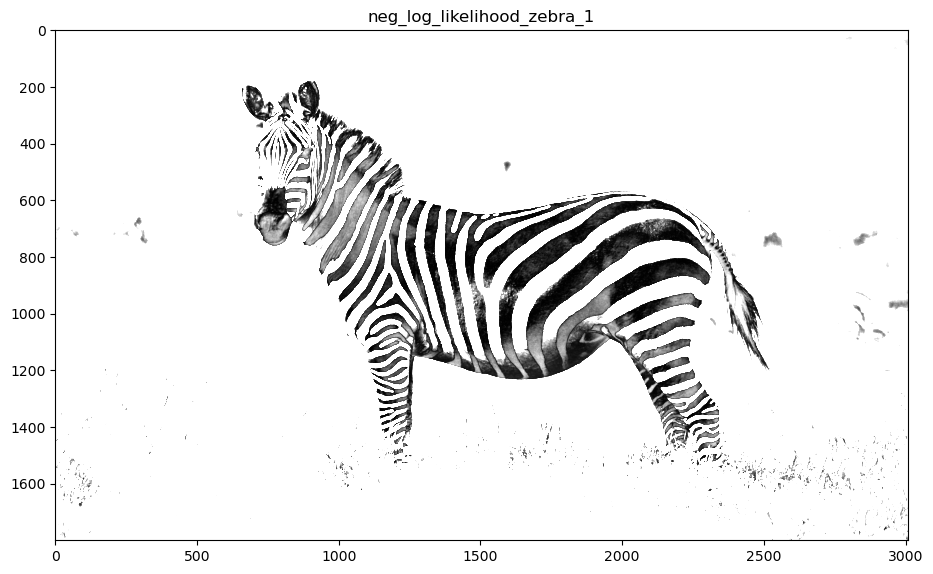

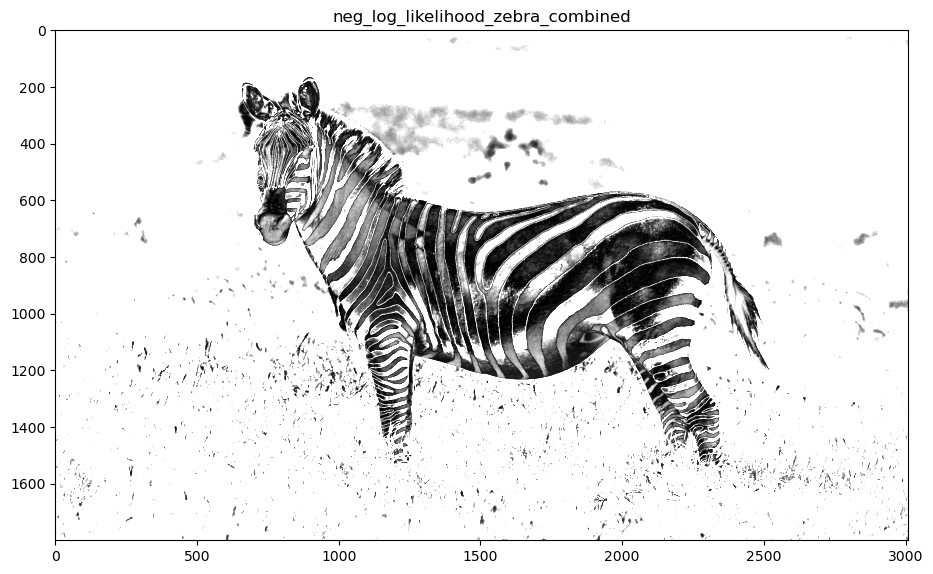

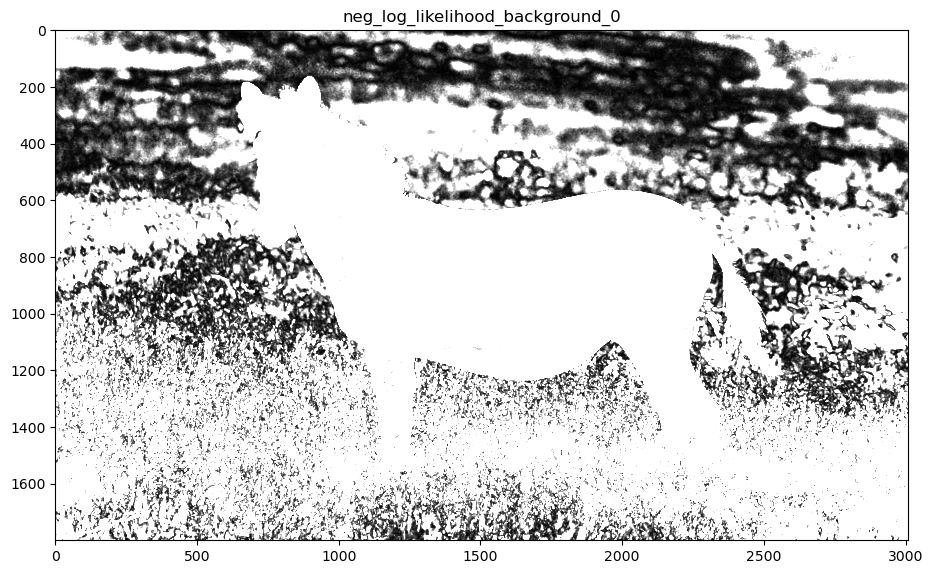

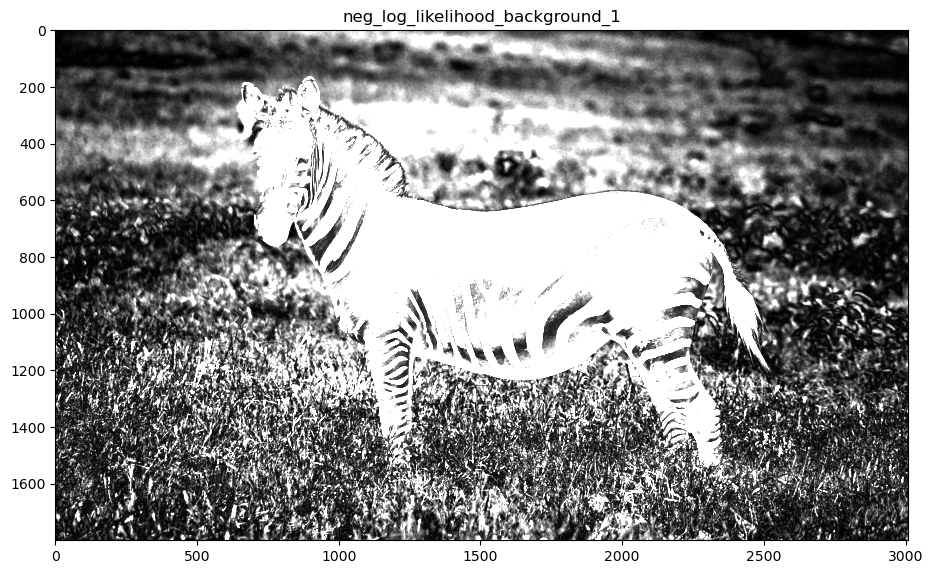

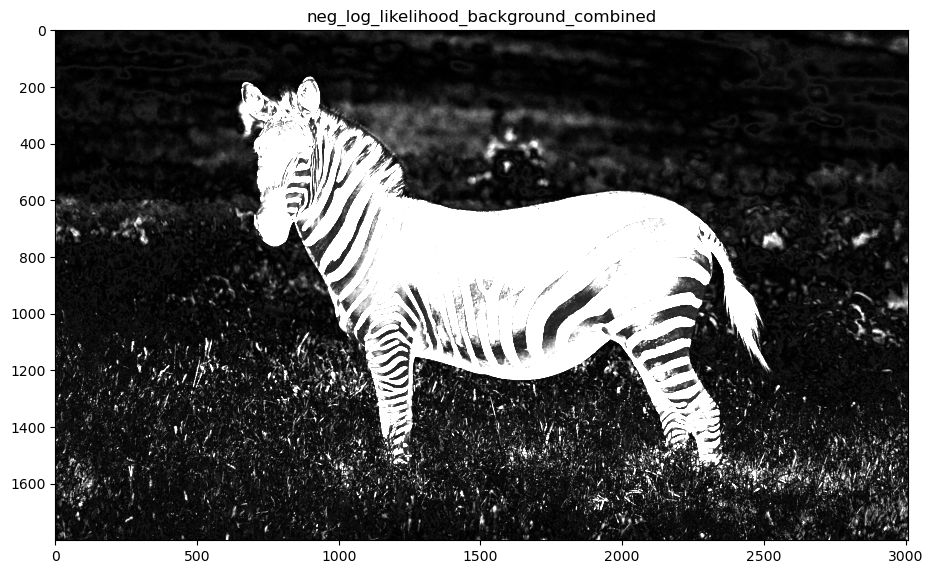

In [19]:
# calculation of the neg-log-likelihood of the zebra class
neg_log_likelihood_zebra_0 = sum(
    (I_zebra[:, :, i] - mean_vectors_zebra[0, i]) ** 2 for i in range(3)
)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_0, cmap="gray", vmax=600)
plt.title("neg_log_likelihood_zebra_0")
plt.show()

neg_log_likelihood_zebra_1 = sum(
    (I_zebra[:, :, i] - mean_vectors_zebra[1, i]) ** 2 for i in range(3)
)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_1, cmap="gray", vmax=5000)
plt.title("neg_log_likelihood_zebra_1")
plt.show()

neg_log_likelihood_zebra_combined = np.minimum(
    sum((I_zebra[:, :, i] - mean_vectors_zebra[0, i]) ** 2 for i in range(3)),
    sum((I_zebra[:, :, i] - mean_vectors_zebra[1, i]) ** 2 for i in range(3)),
)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined, cmap="gray", vmax=5000)
plt.title("neg_log_likelihood_zebra_combined")
plt.show()

# TO BE COMPLETED
# calculate the neg-log-likelihood of the background
# call the output neg_log_likelihood_background_combined
neg_log_likelihood_background_0 = sum(
    (I_zebra[:, :, i] - mean_vectors_background[0, i]) ** 2 for i in range(3)
)

plt.figure()
plt.imshow(neg_log_likelihood_background_0, cmap="gray", vmax=600)
plt.title("neg_log_likelihood_background_0")
plt.show()

neg_log_likelihood_background_1 = sum(
    (I_zebra[:, :, i] - mean_vectors_background[1, i]) ** 2 for i in range(3)
)

plt.figure()
plt.imshow(neg_log_likelihood_background_1, cmap="gray", vmax=5000)
plt.title("neg_log_likelihood_background_1")
plt.show()

neg_log_likelihood_background_combined = np.minimum(
    sum((I_zebra[:, :, i] - mean_vectors_background[0, i]) ** 2 for i in range(3)),
    sum((I_zebra[:, :, i] - mean_vectors_background[1, i]) ** 2 for i in range(3)),
)

plt.figure()
plt.imshow(neg_log_likelihood_background_combined, cmap="gray", vmax=5000)
plt.title("neg_log_likelihood_background_combined")
plt.show()

Q17: From these combined data attachment images (one for the background and one for the zebra), set up a graph-cut segmentation of the image with the $\beta$ of your choice. Comment the result.

**Your answer &#x270D;**

A17:

The obtained result is acceptable, as it was possible to differentiate the zebra from the background, despite some classification errors on the borders of the zebra, more noticeably near its feet and ear, for example.

Max Flow: 7266194497.942651


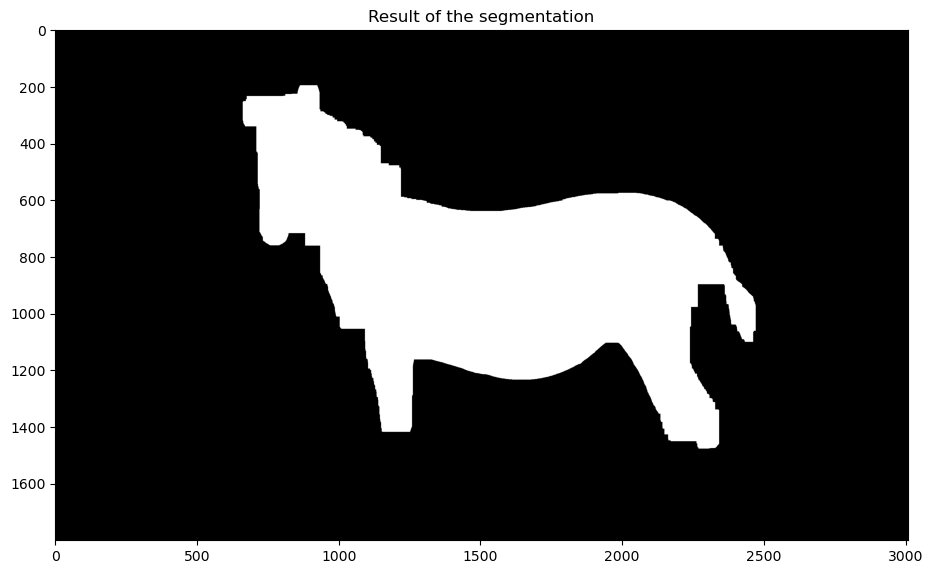

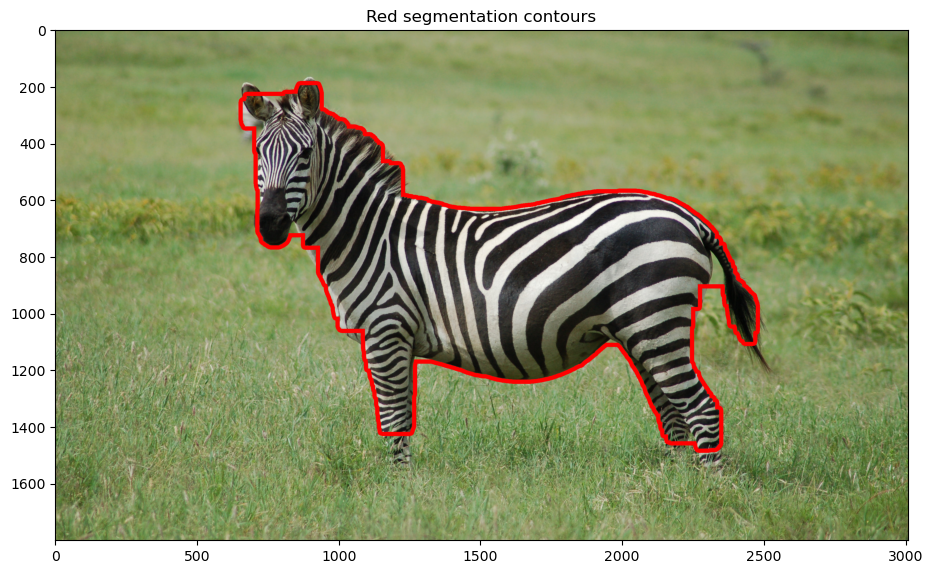

In [20]:
beta = 250000  # Optimal beta value to be determined

## Binary graph cut

# Create the graph.
g = maxflow.Graph[float]()  # Graph instantiation

# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(
    I_zebra.shape[:-1]
)  # Create a grid with a non-terminal node for each pixel in the image

# Add non-terminal edges with the same capacity.
g.add_grid_edges(
    nodeids, beta
)  # Addition of a beta weight edge between each adjacent node according to the 4-connexity

# Add the terminal edges.
# TO BE COMPLETED
g.add_grid_tedges(
    nodeids, neg_log_likelihood_background_combined, neg_log_likelihood_zebra_combined
)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin, cmap="gray")
plt.title("Result of the segmentation")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()

Q18: From the obtained segmentation, determine the mean vectors for 5 classes for the background and 5 classes for the zebra. Use these lists of mean vectors to construct new neg-log-likelihood combination images. Comment on them.

**Your answer &#x270D;**

A18:

The new neg-log-likelihood combined images are more precise than the previous ones, as they separate better, with greater contrast, the background and the zebra.

In [21]:
# The computing of this cell can take several minutes.

X_1 = np.vstack([I_zebra[im_bin == 1, i].flatten() for i in range(3)]).transpose()
kmeans_zebra2 = KMeans(n_init=10, n_clusters=5, random_state=0).fit(X_1)
mean_vectors_zebra2 = kmeans_zebra2.cluster_centers_

X_2 = np.vstack([I_zebra[im_bin == 0, i].flatten() for i in range(3)]).transpose()
kmeans_background2 = KMeans(n_init=10, n_clusters=5, random_state=0).fit(X_2)
mean_vectors_background2 = kmeans_background2.cluster_centers_

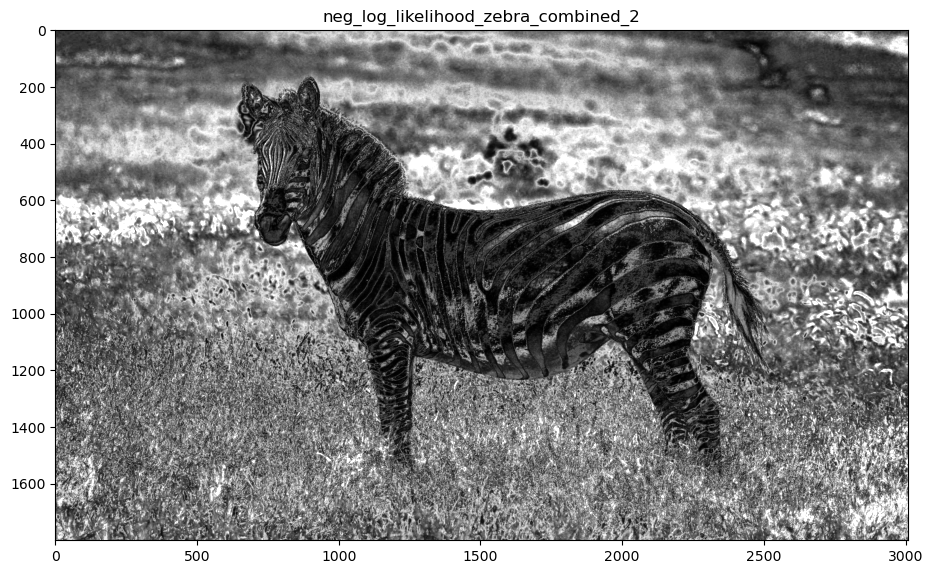

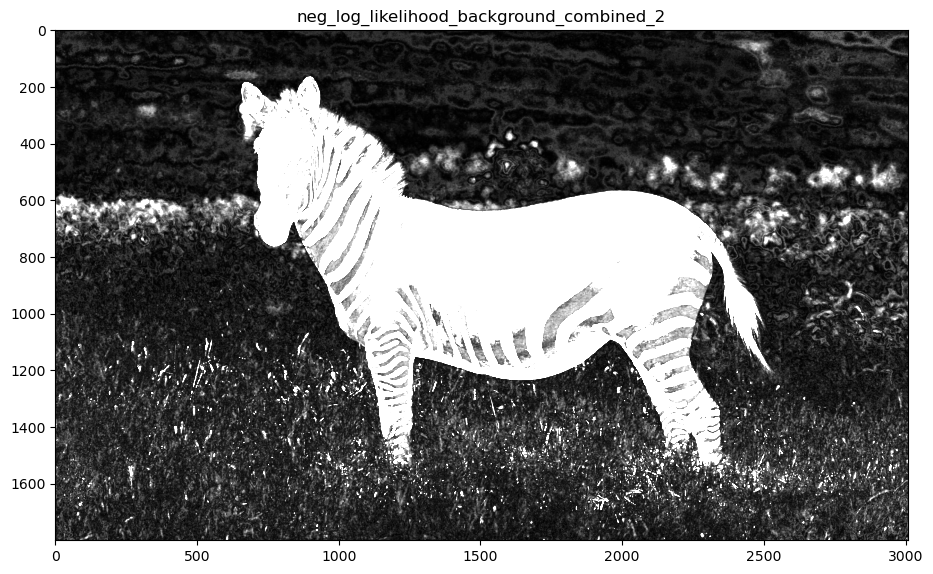

In [22]:
neg_log_likelihood_zebra_combined_2 = np.amin(
    np.dstack(
        [
            (
                sum(
                    (I_zebra[:, :, i] - mean_vectors_zebra2[n_cl, i]) ** 2
                    for i in range(3)
                )
            )
            for n_cl in range(len(mean_vectors_zebra2))
        ]
    ),
    2,
)

neg_log_likelihood_background_combined_2 = np.amin(
    np.dstack(
        [
            (
                sum(
                    (I_zebra[:, :, i] - mean_vectors_background2[n_cl, i]) ** 2
                    for i in range(3)
                )
            )
            for n_cl in range(len(mean_vectors_background2))
        ]
    ),
    2,
)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined_2, cmap="gray", vmax=3000)
plt.title("neg_log_likelihood_zebra_combined_2")
plt.show()

plt.figure()
plt.imshow(neg_log_likelihood_background_combined_2, cmap="gray", vmax=1000)
plt.title("neg_log_likelihood_background_combined_2")
plt.show()


Q19: From these neg-log-likelihood images, segment the image by graph-cut using a new value of $\beta$ that gives you the best result. Comment on the result and the new value of $\beta$ that allowed you to obtain it. What about the new 5-class data attachment compared to the previous one?

**Your answer &#x270D;**

A19:

The results for the new 5-class are considerably better than those for 2-class, with less classification errors on the borders.

The new value of $\beta$ was determined to be $1.4\cdot 10^4$ instead of $2.5\cdot 10^5$ from the previous question. This implies that a weaker regularization is necessary to obtain good results, in this case, as the data attachment terms were closer to a better result.

Max Flow: 1486109821.2891123


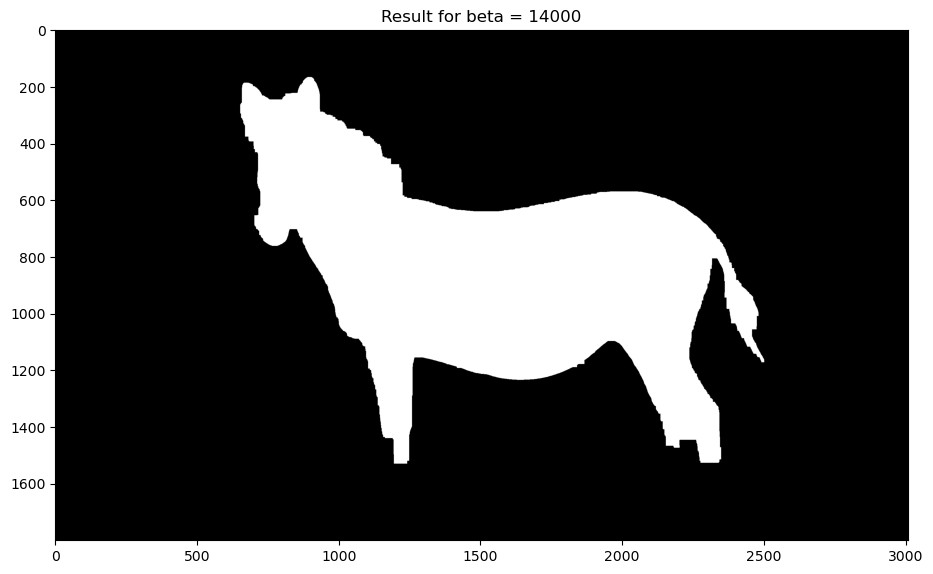

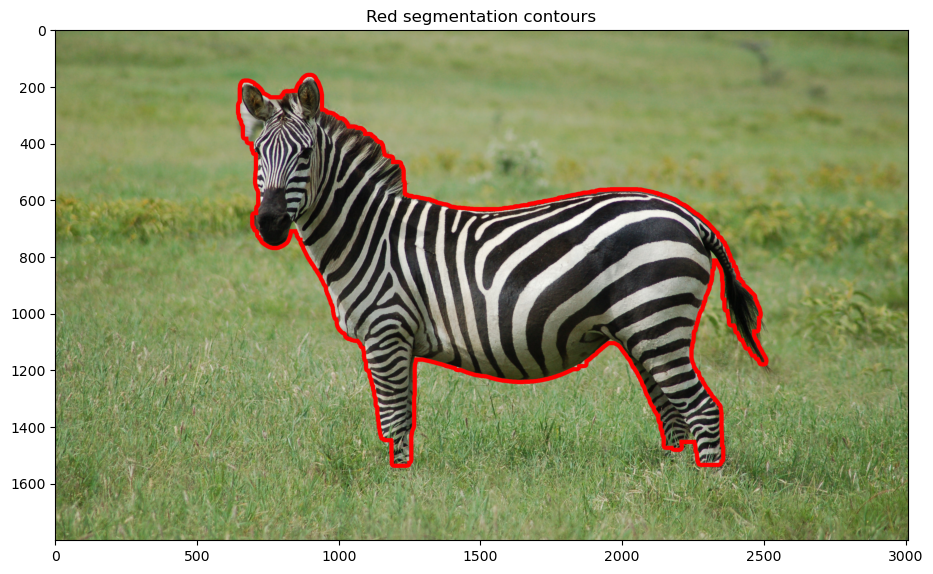

In [23]:
beta = 14000  # Optimal beta value to be determined

g = maxflow.Graph[float]()  # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2])
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta)
# Add the terminal edges.
g.add_grid_tedges(
    nodeids,
    neg_log_likelihood_background_combined_2,
    neg_log_likelihood_zebra_combined_2,
)

flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(
    nodeids
)  # Returns 1 if the pixel is on the drain side after calculation of the min cut, 0 if it is on the source side
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.title("Result for beta = " + str(beta))
plt.imshow(im_bin, cmap="gray")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()